In [4]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests

def get_percentage(x):
    return (np.exp(x) - 1) * 100
SPECIAL_COUNTRIES = ["ISR", "AUS", "CAN", "USA"]
def granger_w_zero_lag(df, maxlag, **kwargs):
    df_copy = df.copy()
    df_copy.iloc[:, 1] = df_copy.iloc[:, 1].shift(-1)
    df_copy = df_copy.fillna(0)
    return grangercausalitytests(df_copy, maxlag, **kwargs)

In [9]:
# download vax dataset at "https://github.com/owid/covid-19-data/raw/master/public/data/vaccinations/vaccinations.csv"
# And put it in "../data/owid_vaccinations.csv"

# nuts = pd.read_csv("../data/NUTS2021.csv")
vax = pd.read_csv("../data/owid_vaccinations.csv")
vax["date"] = pd.to_datetime(vax["date"])
vax.head()
vax["country"] = vax["iso_code"]
vax.loc[vax["iso_code"] == "DEU", "country"] = "DEUTNP"
vax.loc[vax["iso_code"] == "FRA", "country"] = "FRATNP"
vax.loc[vax["iso_code"] == "NZL", "country"] = "NZL_NP"
vax.loc[vax["iso_code"] == "OWID_SCT", "country"] = "GBR_SCO"

for country in ["SWE", "RUS", "SVK", "FIN", "OWID_ENG", "OWID_WLS", "NLD", "PRT"]:
# for country in vax.iso_code.unique():
    vax.loc[vax["iso_code"] == country, ["people_vaccinated"]] = vax[vax["iso_code"] == country]["people_vaccinated"].interpolate(method="ffill")
    vax.loc[vax["iso_code"] == country, ["total_boosters"]] = vax[vax["iso_code"] == country]["total_boosters"].fillna(method="ffill")
    vax.loc[vax["iso_code"] == country, ["people_fully_vaccinated"]] = vax[vax["iso_code"] == country]["people_fully_vaccinated"].fillna(method="ffill")
    vax.loc[vax["iso_code"] == country, ["total_vaccinations"]] = vax[vax["iso_code"] == country]["total_vaccinations"].fillna(method="ffill")


df_GBRTENW = vax[vax["iso_code"] == "OWID_ENG"].copy()
df_GBRTENW.index = pd.to_datetime(df_GBRTENW.date)

df_GBRTENW["country"] = "GBRTENW"

for col in ["people_vaccinated", "total_boosters", "people_fully_vaccinated", "total_vaccinations"]:
    other_df = vax[vax["iso_code"] == "OWID_WLS"]
    other_df.index = pd.to_datetime(other_df.date)
    df_GBRTENW.loc[other_df.index, col] += other_df[col].values
# df_GBRTENW.loc[:, "people_fully_vaccinated"] = df_GBRTENW.loc[:, "total_vaccinations"]

vax = pd.concat([vax, df_GBRTENW])
vax.head()

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,country
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,AFG
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003,AFG
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003,AFG
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003,AFG
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,33.0,1367.0,0.003,AFG


In [10]:
# load data from the "all_countries" notebook computing excess mortality
all_ages_df = pd.read_csv("../data/mortality_all_ages_normalized.csv")
all_ages_df["date"] = pd.to_datetime(all_ages_df.date)
all_ages_df["centered_per"] = get_percentage(all_ages_df["centered"].values)
all_ages_df["centered_per_low"] = get_percentage(all_ages_df["centered_low"].values)
all_ages_df["centered_per_high"] = get_percentage(all_ages_df["centered_high"].values)

all_ages_df.head()


,Unnamed: 0,date,week,year,response,sex,country,age,pop,fit.yearly,fit.weekly,centered,centered_high,centered_low,age_group,centered_per,centered_per_low,centered_per_high
0,high.Sex1,2015-01-05,1,2015,6.060220,b,AUS,65+,47428.535962,6.107542,-0.063700,0.016378,0.050209,-0.050905,high,1.651270,-4.963119,5.149045
1,high.Sex2,2015-01-12,2,2015,6.060220,b,AUS,65+,47428.535962,6.107812,-0.065590,0.017999,0.050209,-0.050905,high,1.816148,-4.963119,5.149045
2,high.Sex3,2015-01-19,3,2015,6.058590,b,AUS,65+,47428.535962,6.108081,-0.066737,0.017246,0.050209,-0.050905,high,1.739584,-4.963119,5.149045
3,high.Sex4,2015-01-26,4,2015,6.050041,b,AUS,65+,47428.535962,6.108351,-0.067177,0.008867,0.050209,-0.050905,high,0.890687,-4.963119,5.149045
4,high.Sex5,2015-02-02,5,2015,6.054867,b,AUS,65+,47428.535962,6.108620,-0.066945,0.013192,0.050209,-0.050905,high,1.327977,-4.963119,5.149045


In [11]:
all_ages_df.country.unique()

array(['AUS', 'AUT', 'BEL', 'BGR', 'CAN', 'CHE', 'CHL', 'CZE', 'DEUTNP',
       'DNK', 'ESP', 'EST', 'FIN', 'FRATNP', 'GBRTENW', 'GBR_NIR',
       'GBR_SCO', 'GRC', 'HRV', 'HUN', 'ISL', 'ISR', 'ITA', 'KOR', 'LTU',
       'LUX', 'LVA', 'NLD', 'NOR', 'NZL_NP', 'POL', 'PRT', 'RUS', 'SVK',
       'SVN', 'SWE', 'TWN', 'USA'], dtype=object)

In [12]:
vax.iso_code.unique()

array(['AFG', 'OWID_AFR', 'ALB', 'DZA', 'AND', 'AGO', 'AIA', 'ATG', 'ARG',
       'ARM', 'ABW', 'OWID_ASI', 'AUS', 'AUT', 'AZE', 'BHS', 'BHR', 'BGD',
       'BRB', 'BLR', 'BEL', 'BLZ', 'BEN', 'BMU', 'BTN', 'BOL', 'BES',
       'BIH', 'BWA', 'BRA', 'VGB', 'BRN', 'BGR', 'BFA', 'BDI', 'KHM',
       'CMR', 'CAN', 'CPV', 'CYM', 'CAF', 'TCD', 'CHL', 'CHN', 'COL',
       'COM', 'COG', 'COK', 'CRI', 'CIV', 'HRV', 'CUB', 'CUW', 'CYP',
       'CZE', 'COD', 'DNK', 'DJI', 'DMA', 'DOM', 'ECU', 'EGY', 'SLV',
       'OWID_ENG', 'GNQ', 'EST', 'SWZ', 'ETH', 'OWID_EUR', 'OWID_EUN',
       'FRO', 'FLK', 'FJI', 'FIN', 'FRA', 'PYF', 'GAB', 'GMB', 'GEO',
       'DEU', 'GHA', 'GIB', 'GRC', 'GRL', 'GRD', 'GTM', 'GGY', 'GIN',
       'GNB', 'GUY', 'HTI', 'OWID_HIC', 'HND', 'HKG', 'HUN', 'ISL', 'IND',
       'IDN', 'IRN', 'IRQ', 'IRL', 'IMN', 'ISR', 'ITA', 'JAM', 'JPN',
       'JEY', 'JOR', 'KAZ', 'KEN', 'KIR', 'OWID_KOS', 'KWT', 'KGZ', 'LAO',
       'LVA', 'LBN', 'LSO', 'LBR', 'LBY', 'LIE', 'LTU', 'OWID_LIC',
 

In [13]:
# Calculate weekly doses administered
combo = pd.merge(vax, all_ages_df, on=["country", "date"], how='right')

def get_weekly_vax(combo):
    dfs = []
    for group, df in combo.groupby(by=["country", "sex", "age_group"]):
    #     if group[0] != "SVK" or group[1] != "b" or group[2] != "adult":
    #         continue
        df.index = pd.to_datetime(df.date)
        df = df.sort_index()
        weekly_vax = df.people_vaccinated.values[1:] - df.people_vaccinated.values[:-1]
        weekly_vax[weekly_vax == 0] = np.nan
        weekly_fully_vax = df.people_fully_vaccinated.values[1:] - df.people_fully_vaccinated.values[:-1]
        weekly_fully_vax[weekly_fully_vax == 0] = np.nan
        weekly_booster_vax = df.total_boosters.values[1:] - df.total_boosters.values[:-1]
        weekly_booster_vax[weekly_booster_vax == 0] = np.nan

        df.loc[:,"weekly_partial_vax"] = np.insert(weekly_vax, 0, df.people_vaccinated.values[0])
        df.loc[:,"weekly_fully_vax"] = np.insert(weekly_fully_vax, 0, df.people_fully_vaccinated.values[0])
        df.loc[:,"weekly_booster_vax"] = np.insert(weekly_booster_vax, 0, df.total_boosters.values[0])
        for col in ["weekly_partial_vax", "weekly_fully_vax", "weekly_booster_vax"]:
            if group[0] in ["ISL", "LUX"]:
                pass
    #             df.loc[:, col] = df.loc[:, col].fillna(method="fill")
            else:
                df.loc[:, col] = df.loc[:, col].interpolate()
        df.loc[df["weekly_partial_vax"].isna(), "weekly_partial_vax"] = 0
        df.loc[df["weekly_fully_vax"].isna(), "weekly_fully_vax"] = 0
        df.loc[df["weekly_booster_vax"].isna(), "weekly_booster_vax"] = 0
        df["weekly_total_vax"] = df.loc[:,"weekly_partial_vax"] + df.loc[:,"weekly_fully_vax"] + df.loc[:,"weekly_booster_vax"]
        df.loc[:, "location"] = df["location"].fillna(method="ffill").fillna(method="bfill")
    #     if group[0] == "ISL" and group[1] == "b" and group[2] == "adult":
    #         break

        dfs.append(df)
    combo = pd.concat(dfs)
    return combo

combo = get_weekly_vax(combo)
# df.index = pd.to_datetime(df.date)
# df = df[~df.iso_code.isnull()]
# df.loc[:, col].interpolate()["2021-10":]

In [14]:
# Calculate everate excess mortality post covid
countries = all_ages_df.country.unique()
pd.options.mode.chained_assignment = None  # default='warn'
avg_mortality_percent = {}
specific = {}
for country in countries:
    specific[country] = combo[(combo.country == country) & 
                (combo.date.dt.year.isin([2020, 2021, 2022])) & 
                (combo.age_group == "high") &
               (combo.sex == "b")]

    avg_mortality_percent[country] = specific[country].centered_per.mean()


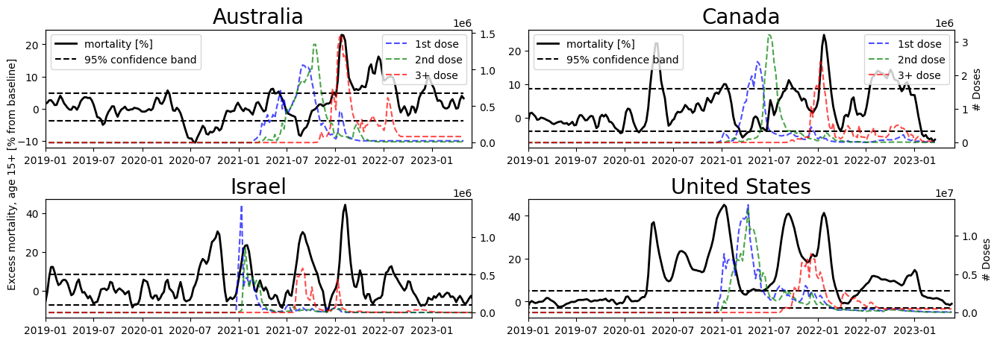

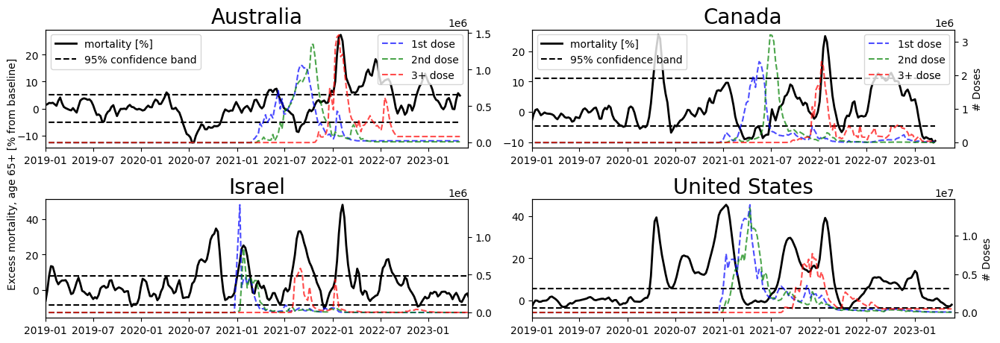

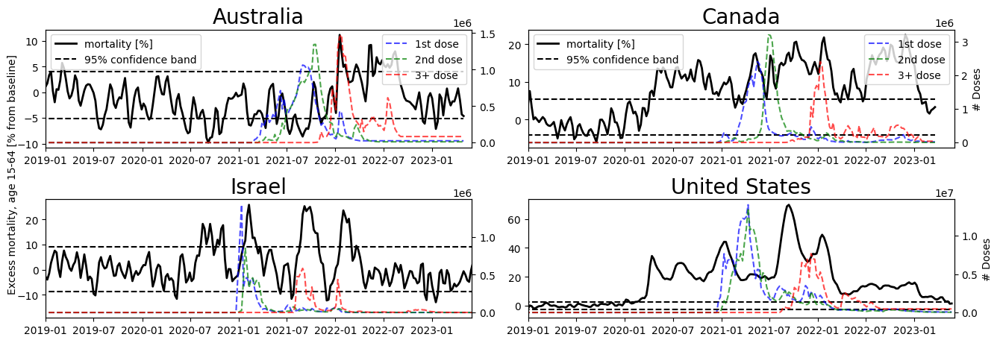

In [39]:
# PLOTS
n_cols = 2
n_countries = len(SPECIAL_COUNTRIES)
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}


for group, age_df in combo.groupby(by=["age_group", "sex"]):
    age_group, sex = group
    if sex != "b":
        continue
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(14,5))
    i = 0
    for country_, df in age_df.groupby(by=["country"]):
        country = country_[0]
        if country not in SPECIAL_COUNTRIES:
            continue
        j = i % n_cols
        k = i // n_cols
        axs[k, j].plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
        axs[k, j].plot(df.date, df.centered_per_low, color="black", linestyle='--', label="95% confidence band")
        axs[k, j].plot(df.date, df.centered_per_high, color="black", linestyle='--')
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        axs[k, j].set_xlim([np.datetime64("2019-01-01"), np.datetime64("2023-06-01")])

        ax2 = axs[k, j].twinx()    
        ax2.plot(df.date, df.weekly_partial_vax, label="1st dose", color="blue", alpha=0.7, linestyle="--")
        ax2.plot(df.date, df.weekly_fully_vax, label="2nd dose", color="green", alpha=0.7, linestyle="--")
        ax2.plot(df.date, df.weekly_booster_vax, label="3+ dose", color="red", alpha=0.7, linestyle="--")
        
        if j == n_cols - 1:
            ax2.set_ylabel("# Doses")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1

    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    plt.ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
    fig.tight_layout()
    # plt.savefig(f"../figures/special_countries_mortality_vs_vax_{age_group}_age_{sex}_sex.jpg", dpi=100)


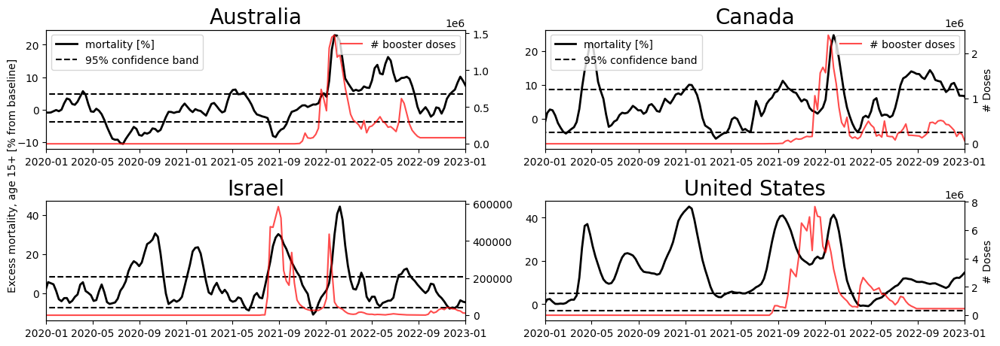

In [42]:

n_cols = 2
n_countries = len(SPECIAL_COUNTRIES)
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}


for group, age_df in combo.groupby(by=["age_group", "sex"]):
    age_group, sex = group
    if age_group != "adult" or sex != "b":
        continue
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(14,5))
    i = 0
    for country_, df in age_df.groupby(by=["country"]):
        country = country_[0]
        if country not in SPECIAL_COUNTRIES:
            continue
        j = i % n_cols
        k = i // n_cols
        axs[k, j].plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
        axs[k, j].plot(df.date, df.centered_per_low, color="black", linestyle='--', label="95% confidence band")
        axs[k, j].plot(df.date, df.centered_per_high, color="black", linestyle='--')
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        axs[k, j].set_xlim([np.datetime64("2020-01-01"), np.datetime64("2023-01-01")])

        ax2 = axs[k, j].twinx()    
        any_dose = df.weekly_booster_vax
        ax2.plot(df.date, any_dose, label="# booster doses", color="red", alpha=0.7)
        if j == n_cols - 1:
            ax2.set_ylabel("# Doses")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1

    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    plt.ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
    fig.tight_layout()
    plt.savefig(f"../figures/special_countries_mortality_vs_booster_{age_group}_age_{sex}_sex.jpg", dpi=100)


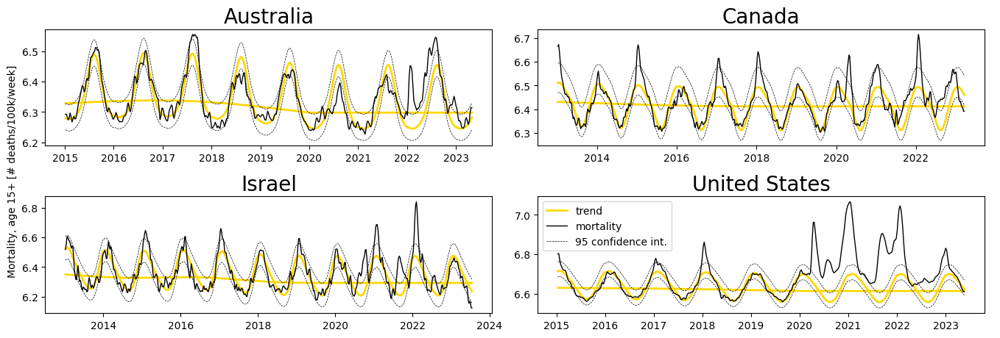

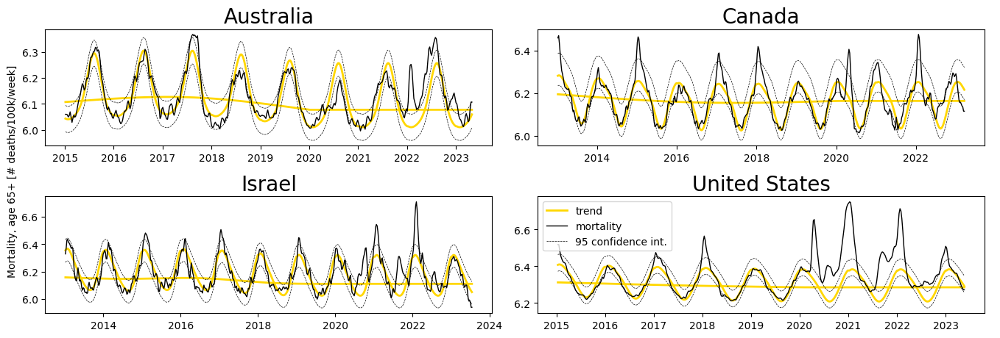

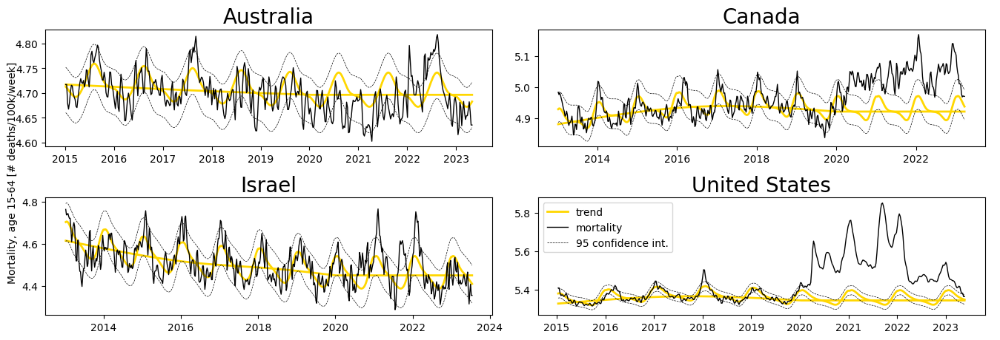

In [45]:
n_countries = len(SPECIAL_COUNTRIES)
n_cols = 2
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}

for age_group, age_df in combo.groupby(by="age_group"):

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(14,5))
    i = 0
    for gdf in age_df.groupby(by="country"):
        country, df = gdf
        if country not in SPECIAL_COUNTRIES:
            continue
        df = df[(df["sex"] == "b")]
        df.index = pd.to_datetime(df.date)

        j = i % n_cols
        k = i // n_cols
        axs[k, j].plot(df.date, df["fit.yearly"].values, color="gold", linewidth=2, label="trend")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values, color="gold", linewidth=2)
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered"].values, color="black", linewidth=1, label="mortality")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered_low"].values, color="black", linestyle='--', linewidth=0.5, label="95 confidence int.")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered_high"].values, color="black", linestyle='--', linewidth=0.5)
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        # axs[k, j].set_xlim([np.datetime64("2017-01-01"), np.datetime64("2023-01-01")])

        if j == 0 and k % n_cols == 0:
            pass
#             axs[k, j].set_ylabel(f"Mortality, age {age_string[age_group]} [# deaths/100k/week]")
        if k == 1 and j == 1:
            axs[k, j].legend(loc="upper left")
#             ax2.legend(loc="upper right")
        i += 1
    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    plt.ylabel(f"Mortality, age {age_string[age_group]} [# deaths/100k/week]")
    fig.tight_layout()
    plt.savefig(f"../figures/special_countries_mortality_w_trend_b_gender_{age_group}_age.jpg", dpi=100)


11


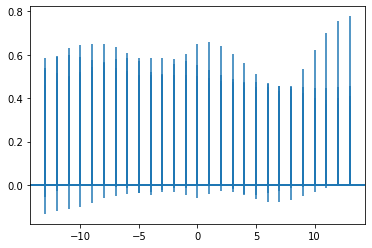

In [806]:
# Shift vax with max autocorrelation
# df = combo[(combo.age_group == "adult") & (combo.sex == "b") & (combo.country == "USA")]
lags = {}
max_lags = 12
vax_type = "weekly_booster_vax"
for country, df in combo.groupby(by=["country"]):
    if country in ["RUS", "GBR_NIR", "HRV", "ISL"]:
        lags[country] = (0, np.nan)
        continue
    df = df[(df.age_group == "adult") & (df.sex == "b")]
    first_dose = np.arange(len(df))[df[vax_type] > 100][0]
    last_dose = np.arange(len(df))[df[vax_type] > 100][-1]

    h = plt.xcorr(df.centered_per, df[vax_type], maxlags=13)
    pos_ind = h[0] >= 0
    argmax = np.argmax(h[1][pos_ind])
    if country == "NOR":
        print(argmax)
    if h[0][pos_ind][argmax] == max_lags:
        lags[country] = (0, np.nan)
    else:
        lags[country] = (h[0][pos_ind][argmax], np.round(h[1][pos_ind][argmax], 2))

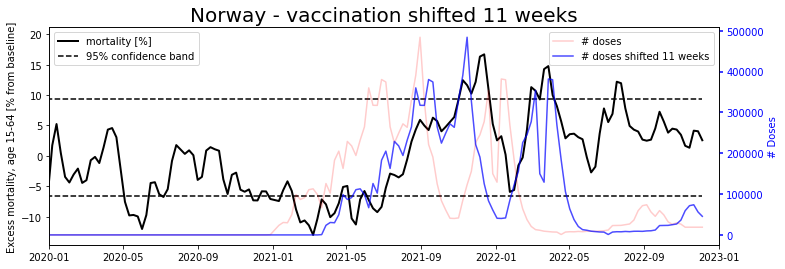

In [895]:
# Plot Norway's data shifted 10 weeks
country = "NOR"
lag = lags[country][0]
df = combo[(combo.age_group == "adult") & (combo.sex == "b") & (combo.country == country)]
fig, ax = plt.subplots(1,1, figsize=(12,4))
plt.plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
plt.plot(df.date, df.centered_per_low, color="black", linestyle='--', label="95% confidence band")
plt.plot(df.date, df.centered_per_high, color="black", linestyle='--')
# plt.title(df.loc[:, "location"].values[0], fontsize=20)
plt.xlim([np.datetime64("2020-01-01"), np.datetime64("2023-01-01")])
plt.ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
plt.legend(loc="upper left")
# plt.grid()
ax2 = ax.twinx()    

any_dose = df.weekly_total_vax
first_dose = np.arange(len(any_dose))[any_dose > 100][0]
last_dose = np.arange(len(any_dose))[any_dose > 100][-1]
p2_orig, = ax2.plot(df.date, any_dose.values, label="# doses", color="red", alpha=0.2)
if lag != 0:
    p2, = ax2.plot(df.date[lag:], any_dose.values[:-lag], label=f"# doses shifted {lag} weeks", color="blue", alpha=0.7)
else:
    p2, = ax2.plot(df.date, any_dose, label="# doses", color="red", alpha=0.7)
# h = granger_w_zero_lag(df.loc[:, ["centered_per", "weekly_booster_vax"]].iloc[first_dose:last_dose,:], lag + 2, verbose=True)
title = f"{df.loc[:, 'location'].values[0]} - vaccination shifted {lags[country][0]} weeks"
plt.title(title, fontsize=20)
ax2.set_ylabel("# Doses")
ax2.legend(handles=[p2_orig, p2], loc="upper right")
ax2.tick_params(axis='y', colors=p2.get_color(), **tkw)
ax2.yaxis.label.set_color(p2.get_color())

plt.savefig(f"../figures/STMF_norway_mortality_vs_vaccine_shifted_{age_group}_age_{sex}_sex.jpg", dpi=100)


In [843]:
# Download weekly c19 data (hospitalizations and mortality) from norway
c19_nor = pd.read_csv("../data/status-for-pandemien-nas-10-01-23.csv")
c19_nor["date"] = pd.to_datetime(c19_nor["Uke"].str.cat(others=["-1"]*len(c19_nor), sep=""), format="%Y-%W-%w")
c19_nor.columns = ['Uke', 'c19-hospitalized',
       'c19-icu',
       'c19-death', 'date']

# load data from the "all_countries" notebook computing excess mortality
nor_df = pd.read_csv("../data/mortality_norway_stratified_normalized.csv")
nor_df["date"] = pd.to_datetime(nor_df.date)
nor_df["centered_per"] = get_percentage(nor_df["centered"].values)
nor_df["centered_per_low"] = get_percentage(nor_df["centered_low"].values)
nor_df["centered_per_high"] = get_percentage(nor_df["centered_high"].values)

nor_df.head()
age_group = "adult"
nor_df["age_group"] = nor_df["age"]
combo_nor = pd.merge(vax, nor_df, on=["country", "date"], how='right')
combo_nor = get_weekly_vax(combo_nor)
df = combo_nor[(combo_nor.age_group == age_group)]
df.index = pd.to_datetime(df.date)
nor_df = df.sort_index()

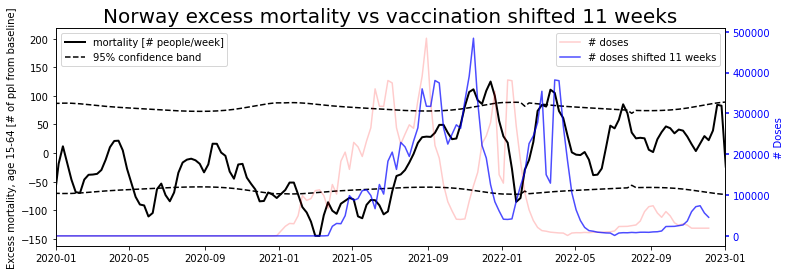

In [896]:
N_PPL_15P = 84000 # Number of people of age 15+
fig, ax = plt.subplots(1,1,figsize=(12,4))
country = "NOR"
def rate_to_ppl(df):
    return (np.exp(df["centered"]) - 1) * np.exp(df["fit.yearly"] + df["fit.weekly"]) * (df["pop"] / N_PPL_15P).values
def rate_to_ppl_low(df):
    return (np.exp(df["centered_low"]) - 1) * np.exp(df["fit.yearly"] + df["fit.weekly"]) * (df["pop"] / N_PPL_15P).values
def rate_to_ppl_high(df):
    return (np.exp(df["centered_high"]) - 1) * np.exp(df["fit.yearly"] + df["fit.weekly"]) * (df["pop"] / N_PPL_15P).values


lag = lags[country][0]
ax.plot(nor_df.date, rate_to_ppl(nor_df), 
        linewidth=2, color="black", label="mortality [# people/week]")
ax.plot(nor_df.date, rate_to_ppl_low(nor_df), 
        linestyle="--", color="black", label="95% confidence band")
ax.plot(nor_df.date, rate_to_ppl_high(nor_df), 
        linestyle="--", color="black")
plt.xlim([np.datetime64("2020-01-01"), np.datetime64("2023-01-01")])
plt.ylabel(f"Excess mortality, age {age_string[age_group]} [# of ppl from baseline]")
plt.legend(loc="upper left")
# plt.grid()
ax2 = ax.twinx()    

any_dose = nor_df.weekly_total_vax
p2_orig, = ax2.plot(df.date, df.weekly_total_vax, label="# doses", color="red", alpha=0.2)
if lag != 0:
    p2, = ax2.plot(df.date[lag:], df.weekly_total_vax.values[:-lag], label=f"# doses shifted {lag} weeks", color="blue", alpha=0.7)
else:
    p2, = ax2.plot(df.date, df.weekly_total_vax, label="# doses", color="red", alpha=0.7)
# h = granger_w_zero_lag(df.loc[:, ["centered_per", "weekly_booster_vax"]].iloc[first_dose:last_dose,:], lag + 2, verbose=True)
title = f"{df.loc[:, 'location'].values[0]} excess mortality vs vaccination shifted {lags[country][0]} weeks"
plt.title(title, fontsize=20)
ax2.set_ylabel("# Doses")
ax2.legend(handles=[p2_orig, p2], loc="upper right")
ax2.tick_params(axis='y', colors=p2.get_color(), **tkw)
ax2.yaxis.label.set_color(p2.get_color())
plt.savefig(f"../figures/norway_excess_mortality_ppl_vs_total_vax.jpg", dpi=100)

In [847]:
# Ballpark deathrate in Norway within 10 weeks of injection (not including people dying after that): 
# Assume 50% are due to vaccination from 2021-03 - 2022-01, height 250 ppl excess mortality, height 300k doses
mortality_rate = 250 / 300 / 2
print(f"Mortality rate: {mortality_rate * 10} per 10k people" )

Mortality rate: 4.166666666666667 per 10k people


(73, 8)


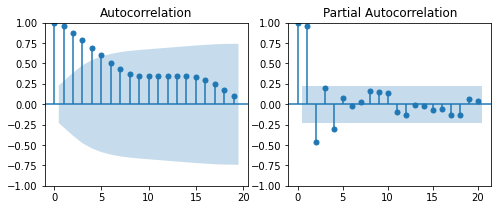

In [878]:
# More rigorous mortality rate estimate
# Fit an ARMA(2,2) model with weekly vax rates as exogenous variable
from statsmodels.tsa.statespace.sarimax import SARIMAX
# SARIMAX()
start_date = "2021-01-01"
end_date = "2022-06-01"
subset = nor_df[start_date:end_date]
# first_dose = np.arange(len(df.weekly_total_vax))[df.weekly_total_vax > 0][0]
# last_dose = np.arange(len(df.weekly_total_vax))[df.weekly_total_vax > 0][-1]
# print(f"Fitting from {df.iloc[first_dose].date:%Y-%m-%d} to {df.iloc[last_dose].date:%Y-%m-%d}")
response = (np.exp(subset["centered"]) - 1) * np.exp(subset["fit.yearly"] + subset["fit.weekly"]) * (subset["pop"] / N_PPL_15P).values
endog = response.values
endog += np.abs(np.min(endog))
relevant_vax_first = subset.weekly_fully_vax.values + subset.weekly_partial_vax.values
relevant_vax_second = subset.weekly_booster_vax.values

fig, ax = plt.subplots(1,2, figsize=(8,3))
acf = sm.graphics.tsa.plot_acf(endog.squeeze(), ax=ax[0])
pacf = sm.graphics.tsa.plot_pacf(endog, lags=20, method="ywm", ax=ax[1])

def get_predictors(raw_signals, cutoff=10, max_lag=14, normalize=True):
    
    predictors = []
    k = 0
    for signal in raw_signals.T:
        for j in range(cutoff, max_lag):
            pred_k = np.roll(signal, j)
            pred_k[:j] = 0
            if np.any(pred_k > 0):
                predictors.append(pred_k)
    exog = np.array(predictors).T  # will have dimensions nobs X n_lags
    if normalize:
        sds = np.std(exog, axis=0)
        exog /= sds
    return exog
exog = get_predictors(np.array([relevant_vax_first, relevant_vax_second]).T)
print(exog.shape)

In [849]:
model_ols = sm.OLS(endog, exog)
res_ols = model_ols.fit()
from scipy.ndimage import uniform_filter1d, convolve1d
smooth_exog = uniform_filter1d(exog, size=3, origin=-1, axis=0)
convolve_exog = convolve1d(exog, weights=[1, 0.5, 0.25], origin=-1, axis=0)
model2 = sm.GLSAR(endog, smooth_exog, rho=4)
res = model2.iterative_fit(maxiter=6)
res.summary()
predictions = res.get_prediction(smooth_exog)
frame = predictions.summary_frame(alpha=0.05)
# convolve
model3 = sm.GLSAR(endog, convolve_exog, rho=4)
res3 = model3.iterative_fit(maxiter=6)

predictions3 = res.get_prediction(convolve_exog)
frame3 = predictions.summary_frame(alpha=0.05)
res3.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                                GLSAR Regression Results                               
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.743
Model:                          GLSAR   Adj. R-squared (uncentered):              0.709
Method:                 Least Squares   F-statistic:                              22.04
Date:                Thu, 19 Jan 2023   Prob (F-statistic):                    2.46e-15
Time:                        12:00:04   Log-Likelihood:                         -279.00
No. Observations:                  69   AIC:                                      574.0
Df Residuals:                      61   BIC:                                      591.9
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             5.3895      5.454      0.988      0.327      -5.517      16.296
x2            15.6911      4.935      3.180      0.002       5.823      25.559
x3            18.9639      4.934      3.844      0.000       9.098      28.830
x4             7.1723      5.467      1.312      0.194      -3.759      18.103
x5            17.4696      4.439      3.935      0.000       8.592      26.347
x6             7.2506      3.720      1.949      0.056      -0.188      14.690
x7             4.9853      3.726      1.338      0.186      -2.465      12.436
x8            15.1975      4.448      3.416      0.001       6.303      24.092
==============================================================================
Omnibus:                        1.996   Durbin-Watson:                   1.656
Prob(Omnibus):                  0.369   Jarque-Bera (JB):                1.758
Skew:                           0.389   Prob(JB):                        0.415
Kurtosis:                       2.916   Cond. No.                         3.22
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

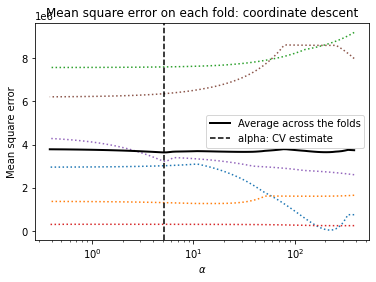

In [841]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.linear_model import LassoCV, LassoLarsIC
# from sklearn.pipeline import make_pipeline
# from sklearn.model_selection import TimeSeriesSplit

# tssplit = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=6, test_size=None)

# model = make_pipeline(LassoCV(cv=tssplit)).fit(X=exog, y=endog)
# model_aic = make_pipeline(LassoLarsIC(criterion="aic")).fit(X=exog, y=endog)

# lasso = model[-1]
# lasso_aic = model[-1]
# plt.semilogx(lasso.alphas_, lasso.mse_path_, linestyle=":")
# plt.plot(
#     lasso.alphas_,
#     lasso.mse_path_.mean(axis=-1),
#     color="black",
#     label="Average across the folds",
#     linewidth=2,
# )
# plt.axvline(lasso.alpha_, linestyle="--", color="black", label="alpha: CV estimate")
# # plt.axvline(lasso_aic.alpha_, linestyle="--", color="red", label="alpha: AIC estimate")

# # plt.ylim(ymin, ymax)
# plt.xlabel(r"$\alpha$")
# plt.ylabel("Mean square error")
# plt.legend()
# _ = plt.title(
#     f"Mean square error on each fold: coordinate descent"
# )


Mortality rate using Generalized Least Squares: 7.17 [3.74, 10.61]
Mortality rate using Ordinary Least Squares: 7.18


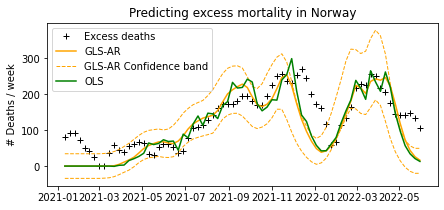

In [850]:
plt.figure(figsize=(7,3))
plt.plot(subset.date, endog, label="Excess deaths", color="black", marker="+", linestyle="")
# plt.plot(subset.date, exog[:, :5] @ lasso.coef_[:5], label="Lasso")
plt.plot(subset.date, res3.fittedvalues, label="GLS-AR", linestyle="-", color="orange")
plt.plot(subset.date, frame3.obs_ci_lower, label="GLS-AR Confidence band", linestyle="--", color="orange", linewidth=1)
plt.plot(subset.date, frame3.obs_ci_upper, linestyle="--", color="orange", linewidth=1)
plt.plot(subset.date, res_ols.fittedvalues, label="OLS", color="green")
plt.ylabel("# Deaths / week")
plt.ylabel("# Deaths / week")
plt.title("Predicting excess mortality in Norway")
plt.legend()
plt.savefig("../figures/predicting_excess_mortality.jpg", dpi=100)
mortality_rate_lasso = sum(exog[:, :5] @ lasso.coef_[:5]) / sum(subset["weekly_total_vax"])
mortality_rate_gls = sum(res.fittedvalues) / sum(subset["weekly_total_vax"])
mortality_rate_gls_low = np.round(sum(frame.obs_ci_lower) / sum(subset["weekly_total_vax"])*10000, 2)
mortality_rate_gls_high = np.round(sum(frame.obs_ci_upper) / sum(subset["weekly_total_vax"])*10000, 2)
mortality_rate_ols = sum(res_ols.fittedvalues) / sum(subset["weekly_total_vax"])
# print(f"Mortality rate using lasso: {np.round(mortality_rate_lasso * 10000, 2)}")
print(f"Mortality rate using Generalized Least Squares: {np.round(mortality_rate_gls * 10000, 2)} [{mortality_rate_gls_low}, {mortality_rate_gls_high}]")
print(f"Mortality rate using Ordinary Least Squares: {np.round(mortality_rate_ols * 10000, 2)}")

In [884]:
# Fit model to all countries
start_date = "2020-12-01"
end_date = "2022-06-01"
country_fit = {} 
country_ci = {}
for country, df in combo.groupby(by=["country"]):
    if country in ["RUS", "GBR_NIR", "HRV", "ISL"]:
        continue
    df = df[(df.age_group == "adult") & (df.sex == "b")]
    subset = df[start_date:end_date]
    response = rate_to_ppl(subset)
    endog = response.values
    endog += np.abs(np.min(endog))
    relevant_vax_first = subset.weekly_fully_vax.values + subset.weekly_partial_vax.values
    relevant_vax_second = subset.weekly_booster_vax.values
    
    cutoff = np.maximum(0, lags[country][0] - 2)
    max_lag = lags[country][0] + 2
    if np.any(relevant_vax_second > 0):
        exog = get_predictors(np.array([relevant_vax_first, relevant_vax_second]).T, cutoff=cutoff, max_lag=max_lag)
    else:
        exog = get_predictors(np.array([relevant_vax_first]).T)
    
    convolve_exog = convolve1d(exog, weights=[1, 0.5, 0.25], origin=-1, axis=0)
    model3 = sm.GLSAR(endog, convolve_exog, rho=4)
    res3 = model3.iterative_fit(maxiter=6)
    predictions3 = res3.get_prediction(convolve_exog)
    frame3 = predictions3.summary_frame(alpha=0.05)
    country_fit[country] = res3 
    country_ci[country] = frame3 

Australia: Mortality rate using Generalized Least Squares: 1.89 [0.18, 3.6]
Austria: Mortality rate using Generalized Least Squares: 2.08 [-0.83, 4.99]
Belgium: Mortality rate using Generalized Least Squares: 1.24 [-1.65, 4.14]
Bulgaria: Mortality rate using Generalized Least Squares: 60.14 [23.83, 96.44]
Canada: Mortality rate using Generalized Least Squares: 2.15 [0.29, 4.01]
Switzerland: Mortality rate using Generalized Least Squares: 2.26 [-0.54, 5.06]
Chile: Mortality rate using Generalized Least Squares: 4.03 [0.78, 7.28]
Czechia: Mortality rate using Generalized Least Squares: 5.47 [-2.15, 13.09]
Germany: Mortality rate using Generalized Least Squares: 1.04 [-2.28, 4.36]
Denmark: Mortality rate using Generalized Least Squares: 2.35 [-0.84, 5.55]
Spain: Mortality rate using Generalized Least Squares: 1.36 [-2.43, 5.15]
Estonia: Mortality rate using Generalized Least Squares: 9.4 [0.53, 18.27]
Finland: Mortality rate using Generalized Least Squares: -1.13 [-24.42, 22.16]
France: M

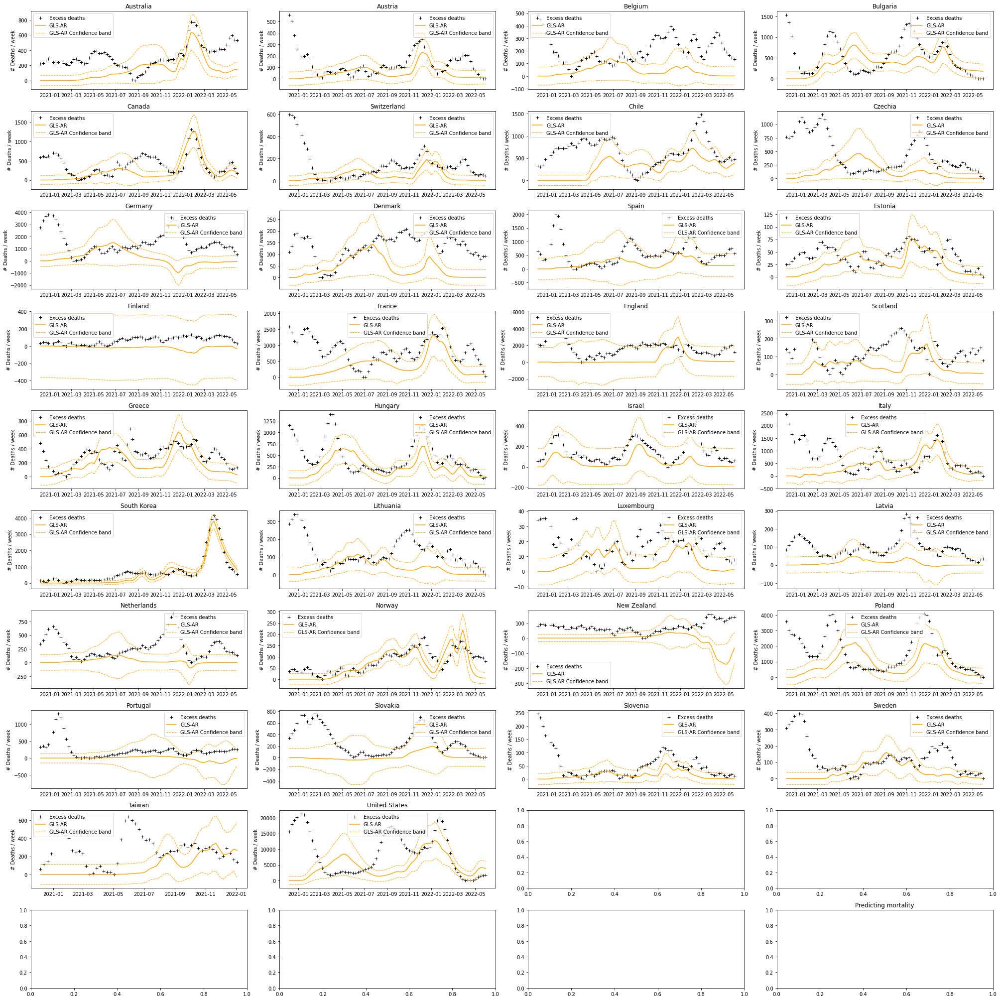

In [894]:
n_countries = len(countries)
n_cols = 4
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}

fig, axs = plt.subplots(n_rows, n_cols, figsize=(28,28))
    
i = 0
for country, df in combo.groupby(by=["country"]):
    if country in ["RUS", "GBR_NIR", "HRV", "ISL"]:
        continue
    j = i % n_cols
    k = i // n_cols
    df = df[(df.age_group == "adult") & (df.sex == "b")]
    subset = df[start_date:end_date]
    response = rate_to_ppl(subset)
    endog = response.values
    endog += np.abs(np.min(endog))
    axs[k, j].plot(subset.date, endog, label="Excess deaths", color="black", marker="+", linestyle="")
    axs[k, j].plot(subset.date, country_fit[country].fittedvalues, label="GLS-AR", linestyle="-", color="orange")
    axs[k, j].plot(subset.date, country_ci[country].obs_ci_lower, label="GLS-AR Confidence band", linestyle="--", color="orange", linewidth=1)
    axs[k, j].plot(subset.date, country_ci[country].obs_ci_upper, linestyle="--", color="orange", linewidth=1)
    axs[k, j].set_ylabel("# Deaths / week")
    axs[k, j].set_title(f"{subset['location'].iloc[0]}")
    axs[k, j].legend()
    fig.tight_layout()
    mortality_rate_gls = sum(country_fit[country].fittedvalues) / sum(subset["weekly_total_vax"])
    mortality_rate_gls_low = np.round(sum(country_ci[country].obs_ci_lower) / sum(subset["weekly_total_vax"])*10000, 2)
    mortality_rate_gls_high = np.round(sum(country_ci[country].obs_ci_upper) / sum(subset["weekly_total_vax"])*10000, 2)
    
    i += 1
    print(f"{subset['location'].iloc[0]}: Mortality rate using Generalized Least Squares: {np.round(mortality_rate_gls * 10000, 2)} [{mortality_rate_gls_low}, {mortality_rate_gls_high}]")
plt.title("Predicting mortality")

plt.savefig(f"../figures/predicting_excess_mortality_all_countries.jpg", dpi=100)

In [883]:
country

'USA'

In [882]:
country_fit[country].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                GLSAR Regression Results                               
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.329
Model:                          GLSAR   Adj. R-squared (uncentered):              0.246
Method:                 Least Squares   F-statistic:                              3.975
Date:                Thu, 19 Jan 2023   Prob (F-statistic):                    0.000699
Time:                        12:09:33   Log-Likelihood:                         -571.77
No. Observations:                  73   AIC:                                      1160.
Df Residuals:                      65   BIC:                                      1178.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1           270.4636    257.786      1.049      0.298    -244.370     785.297
x2           439.0845    261.845      1.677      0.098     -83.856     962.025
x3           406.3044    261.912      1.551      0.126    -116.770     929.379
x4           201.7516    258.394      0.781      0.438    -314.296     717.800
x5           139.4583    213.371      0.654      0.516    -286.672     565.589
x6           386.6962    222.072      1.741      0.086     -56.811     830.204
x7           758.9701    222.828      3.406      0.001     313.951    1203.989
x8           791.1072    215.772      3.666      0.000     360.181    1222.034
==============================================================================
Omnibus:                        2.876   Durbin-Watson:                   0.831
Prob(Omnibus):                  0.237   Jarque-Bera (JB):                2.630
Skew:                           0.019   Prob(JB):                        0.268
Kurtosis:                       3.929   Cond. No.                         2.10
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [897]:
df.date

date
2013-01-07   2013-01-07
2013-01-14   2013-01-14
2013-01-21   2013-01-21
2013-01-28   2013-01-28
2013-02-04   2013-02-04
                ...    
2022-11-07   2022-11-07
2022-11-14   2022-11-14
2022-11-21   2022-11-21
2022-11-28   2022-11-28
2022-12-05   2022-12-05
Name: date, Length: 516, dtype: datetime64[ns]

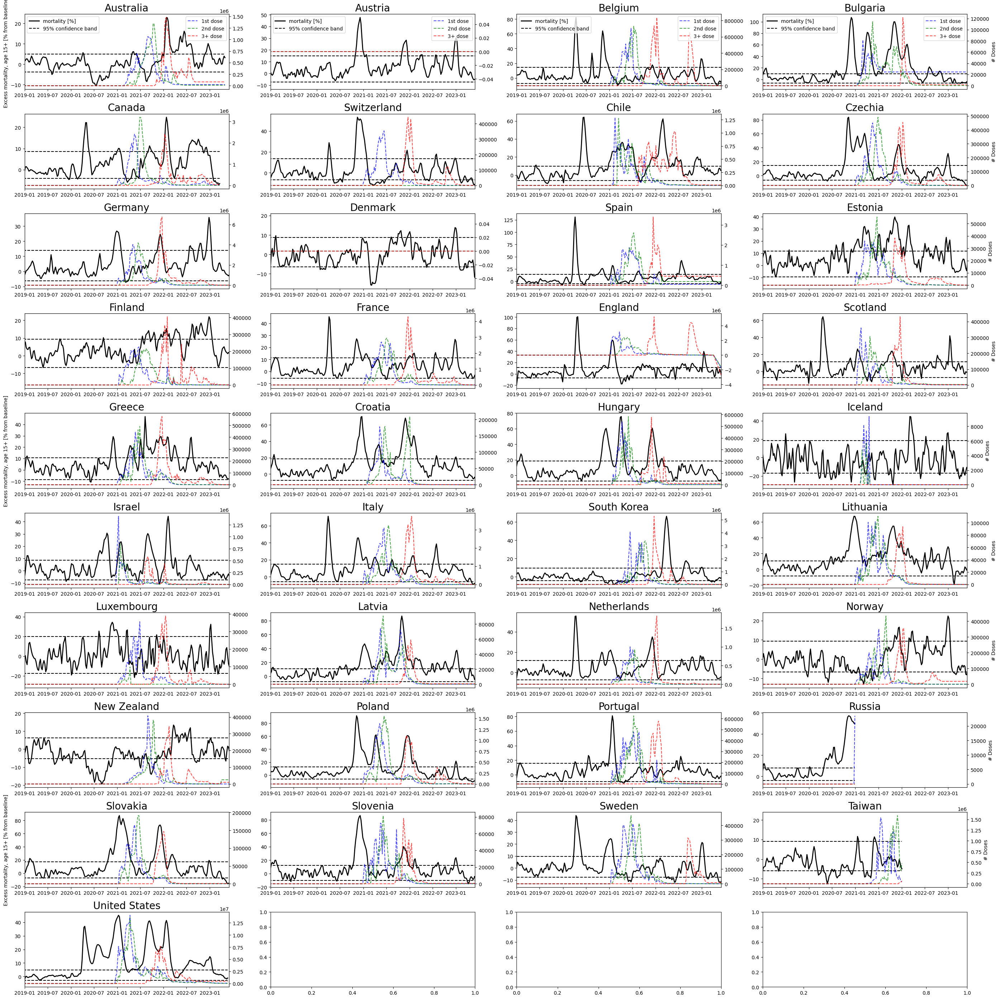

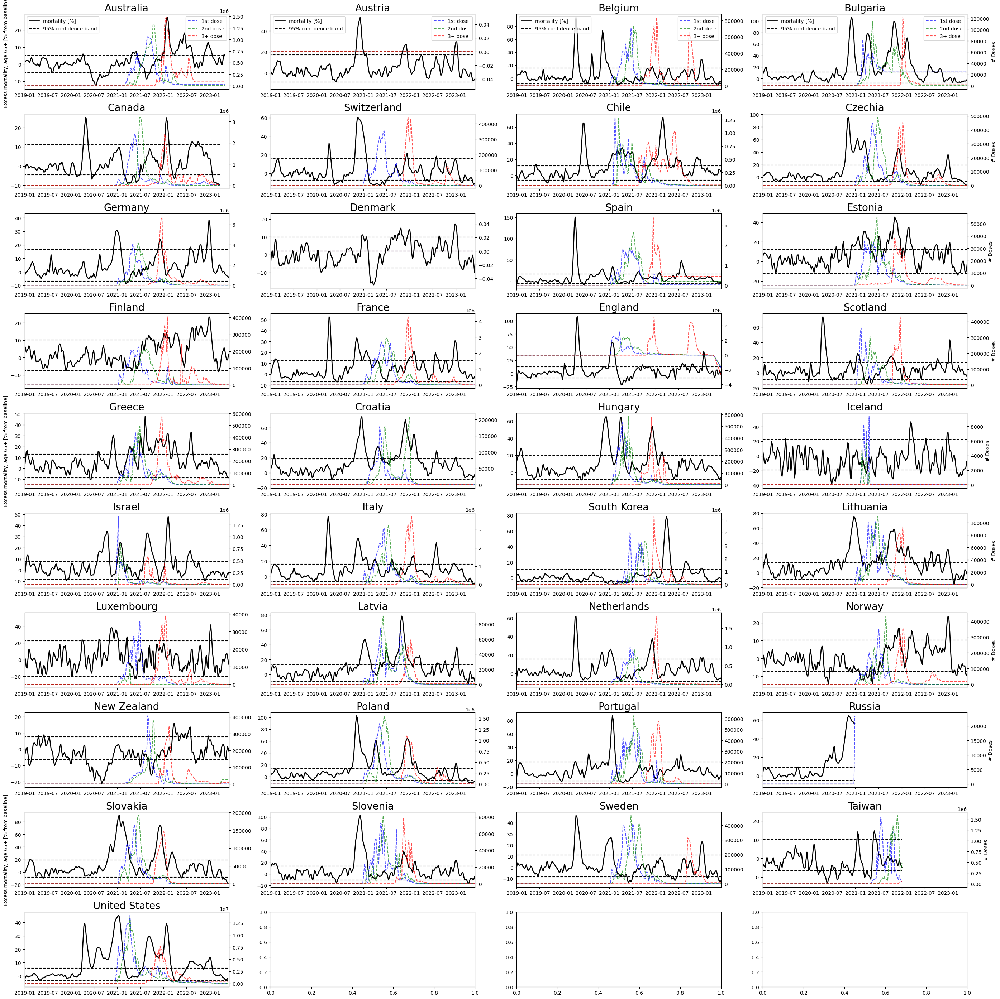

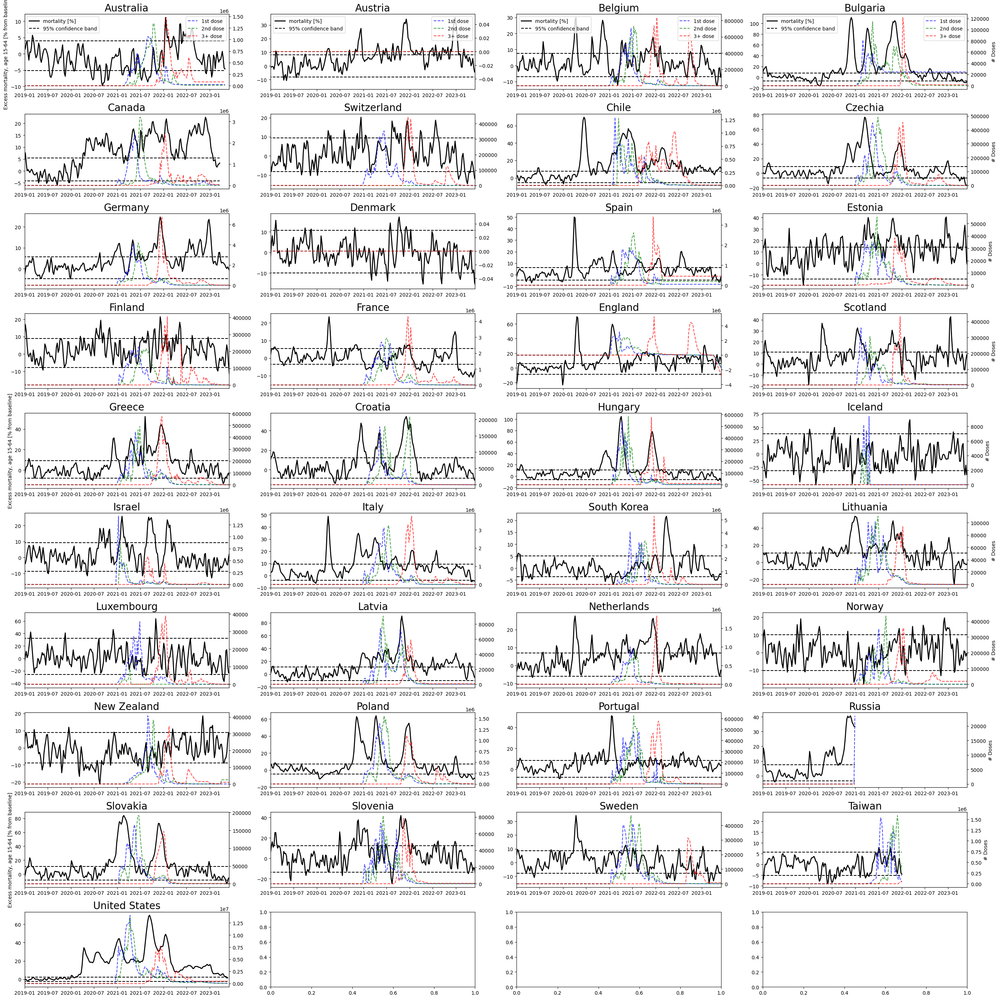

In [46]:
# Appendix
n_countries = len(countries)
n_cols = 4
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}

for group, age_df in combo.groupby(by=["age_group", "sex"]):
    age_group, sex = group
    if sex != "b":
        continue
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(28,28))
    i = 0
    for country, df in age_df.groupby(by="country"):
        j = i % n_cols
        k = i // n_cols
        if df.loc[:, "location"].isnull().iloc[0]:
            continue
        axs[k, j].plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
        axs[k, j].plot(df.date, df.centered_per_low, color="black", linestyle='--', label="95% confidence band")
        axs[k, j].plot(df.date, df.centered_per_high, color="black", linestyle='--')
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        axs[k, j].set_xlim([np.datetime64("2019-01-01"), np.datetime64("2023-06-01")])

        ax2 = axs[k, j].twinx()    
    
        ax2.plot(df.date, df.weekly_partial_vax, label="1st dose", color="blue", alpha=0.7, linestyle="--")
        ax2.plot(df.date, df.weekly_fully_vax, label="2nd dose", color="green", alpha=0.7, linestyle="--")
        ax2.plot(df.date, df.weekly_booster_vax, label="3+ dose", color="red", alpha=0.7, linestyle="--")
        if j == n_cols - 1:
            ax2.set_ylabel("# Doses")
        if j == 0 and k % n_cols == 0:
            axs[k, j].set_ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1


    fig.tight_layout()
    plt.savefig(f"../figures/all_countries_mortality_vs_vax_{age_group}_age_{sex}_sex.jpg", dpi=100)


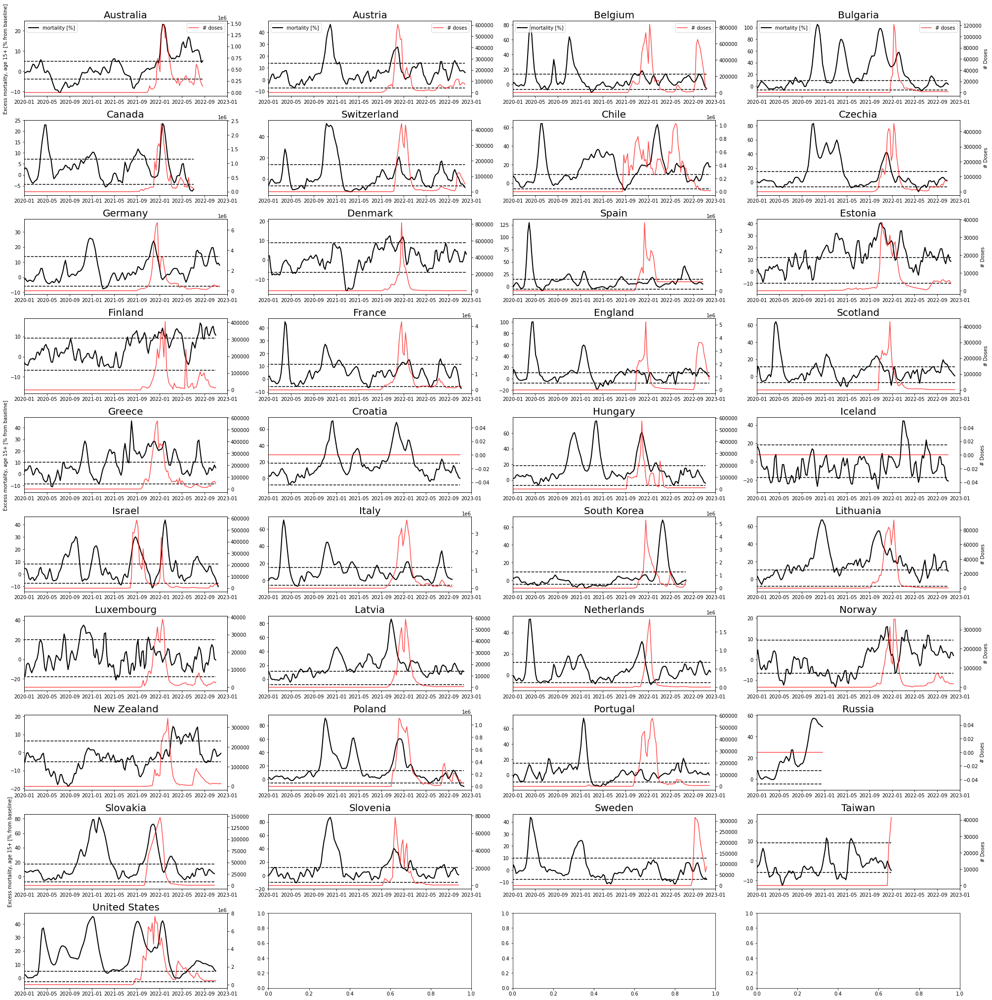

In [153]:
n_countries = len(countries)
n_cols = 4
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}

for group, age_df in combo.groupby(by=["age_group", "sex"]):
    age_group, sex = group
    if age_group != "adult" or sex != "b":
        continue
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(28,28))
    i = 0
    for country, df in age_df.groupby(by="country"):
        j = i % n_cols
        k = i // n_cols
        if df.loc[:, "location"].isnull().iloc[0]:
            continue
        axs[k, j].plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
        axs[k, j].plot(df.date, df.centered_per_low, color="black", linestyle='--')
        axs[k, j].plot(df.date, df.centered_per_high, color="black", linestyle='--')
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        axs[k, j].set_xlim([np.datetime64("2019-01-01"), np.datetime64("2023-06-01")])

        ax2 = axs[k, j].twinx()    
        any_dose = df.weekly_booster_vax
        ax2.plot(df.date, any_dose, label="# doses", color="red", alpha=0.7)
        if j == n_cols - 1:
            ax2.set_ylabel("# Doses")
        if j == 0 and k % n_cols == 0:
            axs[k, j].set_ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1


    fig.tight_layout()
    plt.savefig(f"../figures/all_countries_mortality_vs_booster_{age_group}_age_{sex}_sex.jpg", dpi=100)


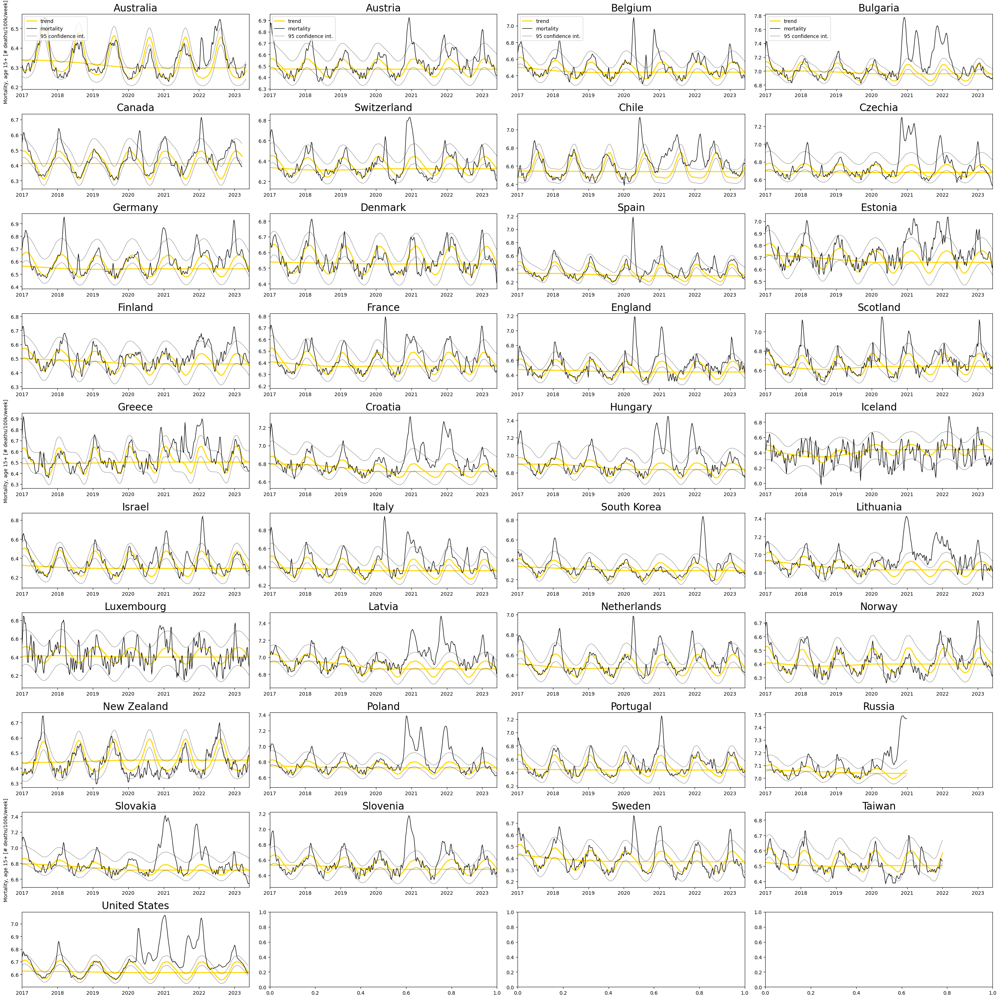

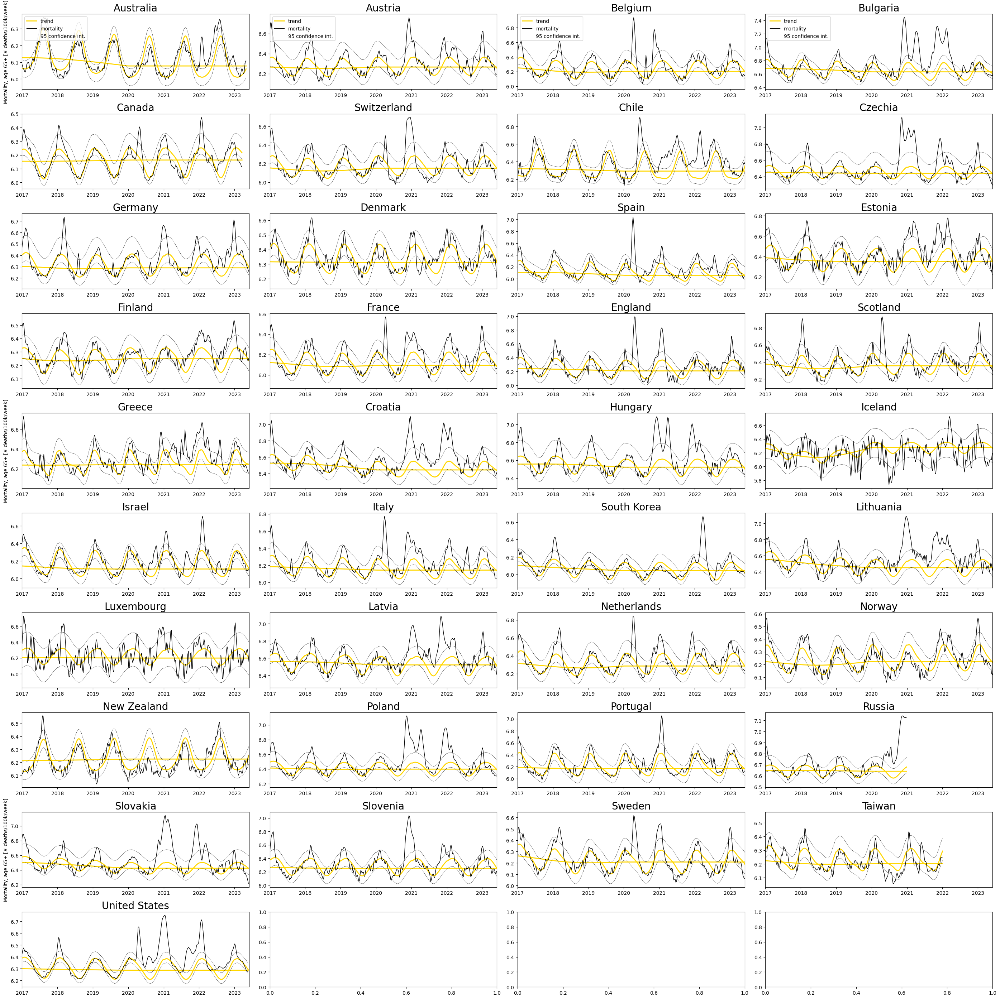

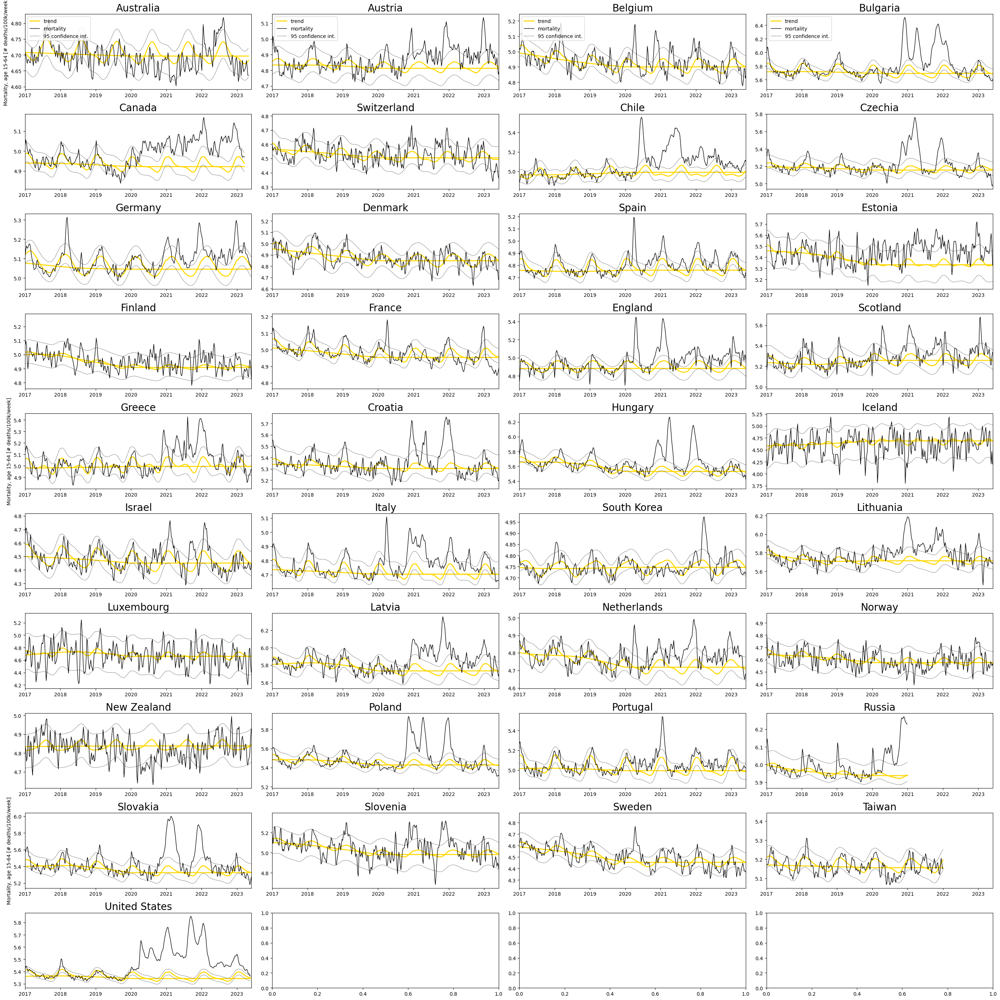

In [48]:
n_countries = len(countries)
n_cols = 4
n_rows = int(np.ceil(n_countries / n_cols))


age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}

for age_group, age_df in combo.groupby(by="age_group"):
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(28,28))
    i = 0
    for gdf in age_df.groupby(by=["country"]):
        country, df = gdf
        df = df[(df["sex"] == "b")]
        df.index = pd.to_datetime(df.date)
        if df.loc[:, "location"].isnull().iloc[0]:
            continue
        
        j = i % n_cols
        k = i // n_cols
        axs[k, j].plot(df.date, df["fit.yearly"].values, color="gold", linewidth=2, label="trend")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values, color="gold", linewidth=2)
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered"].values, color="black", linewidth=1, label="mortality")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered_low"].values, color="black", linestyle='--', linewidth=0.5, label="95 confidence int.")
        axs[k, j].plot(df.date, df["fit.yearly"].values + df["fit.weekly"].values + df["centered_high"].values, color="black", linestyle='--', linewidth=0.5)
        axs[k, j].set_title(df.loc[:, "location"].values[0], fontsize=20)
        axs[k, j].set_xlim([np.datetime64("2017-01-01"), np.datetime64("2023-06-01")])

        if j == 0 and k % n_cols == 0:
            axs[k, j].set_ylabel(f"Mortality, age {age_string[age_group]} [# deaths/100k/week]")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1


    fig.tight_layout()
    plt.savefig(f"../figures/all_countries_mortality_w_trend_b_gender_{age_group}_age.jpg", dpi=100)


In [173]:
# ESP standard population
std_esp_pop = np.array((1000, 4000, 5500, 5500, 5500, 6000, 6000, 6500, 7000, 
            7000, 7000, 7000, 6500, 6000, 5500, 5000, 4000, 2500, 1500, 800, 200))
esp_group = np.array([0,1] + np.arange(5,95,5).tolist() + [200])
esp = pd.DataFrame({"age": esp_group, "n": std_esp_pop})
esp[esp.age>=15].n.sum()

84000

In [32]:
vax_orig = pd.read_csv("../data/owid_vaccinations.csv")
df = vax_orig[(vax_orig.iso_code == "SVK")]
df.index = pd.to_datetime(df.date)
df["2021-10":]

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred
date,,,,,,,,,,,,,,,,
2021-10-01,Slovakia,SVK,2021-10-01,NaN,NaN,NaN,NaN,NaN,3886.0,NaN,NaN,NaN,NaN,689.0,2126.0,0.038
2021-10-02,Slovakia,SVK,2021-10-02,NaN,NaN,NaN,NaN,NaN,3799.0,NaN,NaN,NaN,NaN,673.0,2074.0,0.037
2021-10-03,Slovakia,SVK,2021-10-03,4784375.0,2475811.0,2391301.0,103.0,NaN,3711.0,84.78,43.87,42.37,0.00,658.0,2022.0,0.036
2021-10-04,Slovakia,SVK,2021-10-04,NaN,NaN,NaN,NaN,NaN,3658.0,NaN,NaN,NaN,NaN,648.0,1970.0,0.035
2021-10-05,Slovakia,SVK,2021-10-05,NaN,NaN,NaN,NaN,NaN,3606.0,NaN,NaN,NaN,NaN,639.0,1917.0,0.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-27,Slovakia,SVK,2022-07-27,NaN,NaN,NaN,NaN,NaN,97.0,NaN,NaN,NaN,NaN,17.0,12.0,0.000
2022-07-28,Slovakia,SVK,2022-07-28,NaN,NaN,NaN,NaN,NaN,85.0,NaN,NaN,NaN,NaN,15.0,11.0,0.000
2022-07-29,Slovakia,SVK,2022-07-29,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN,NaN,NaN,13.0,9.0,0.000


In [95]:
# combo[(combo.country == "SVK") & (combo.sex == "b") & (age_group == "high")]
df = combo[(combo.country == "SVK") & (combo.sex == "b") & (combo.age_group=="adult")]
df.index = pd.to_datetime(df.date)

In [55]:
mean_excess = pd.DataFrame(data=avg_mortality_percent.values(), index=avg_mortality_percent.keys(), columns=["excess_mortality"])
mean_excess.sort_values(by="excess_mortality")

,excess_mortality
ISL,-11.413092
NZL_NP,-6.525601
TWN,-3.105739
NOR,-2.944951
KOR,-0.977984
AUS,-0.828823
DNK,0.615639
CAN,0.616071
FIN,1.016489
SWE,2.660293


AUS: 0.00018922898204034398
AUT: 0.44609758170683167
BEL: 0.7664252242451817
BGR: 0.022700442152562512
CAN: 1.0407702995377075e-06
CHE: 0.13383489324894993
CHL: 0.09217831390935168
CZE: 0.08039191993999328
DEUTNP: 0.16120677004815823
DNK: 0.40987748409919256
ESP: 0.4142035074819038
EST: 0.2718761513493793
FIN: 0.06994878324940121
FRATNP: 0.03954992357030832
GBRTENW: 0.9777767416037635
GBR_SCO: 0.152882730596172
GRC: 0.08462510177825983
HUN: 0.008017193986759949
ISR: 5.403860434330055e-06
ITA: 0.15430697838460095
KOR: 7.85914708965389e-18
LTU: 0.6511628053438173
LUX: 0.7881765061738557
LVA: 0.11914161082583441
NLD: 3.9515598337214685e-05
NOR: 0.02109407424529266
NZL_NP: 0.03373330742899719
POL: 0.25230706483912213
PRT: 0.6951486256528279
SVK: 0.008490834607694574
SVN: 0.8151425420293179
SWE: 0.7669471582302646
USA: 0.017252890282043236


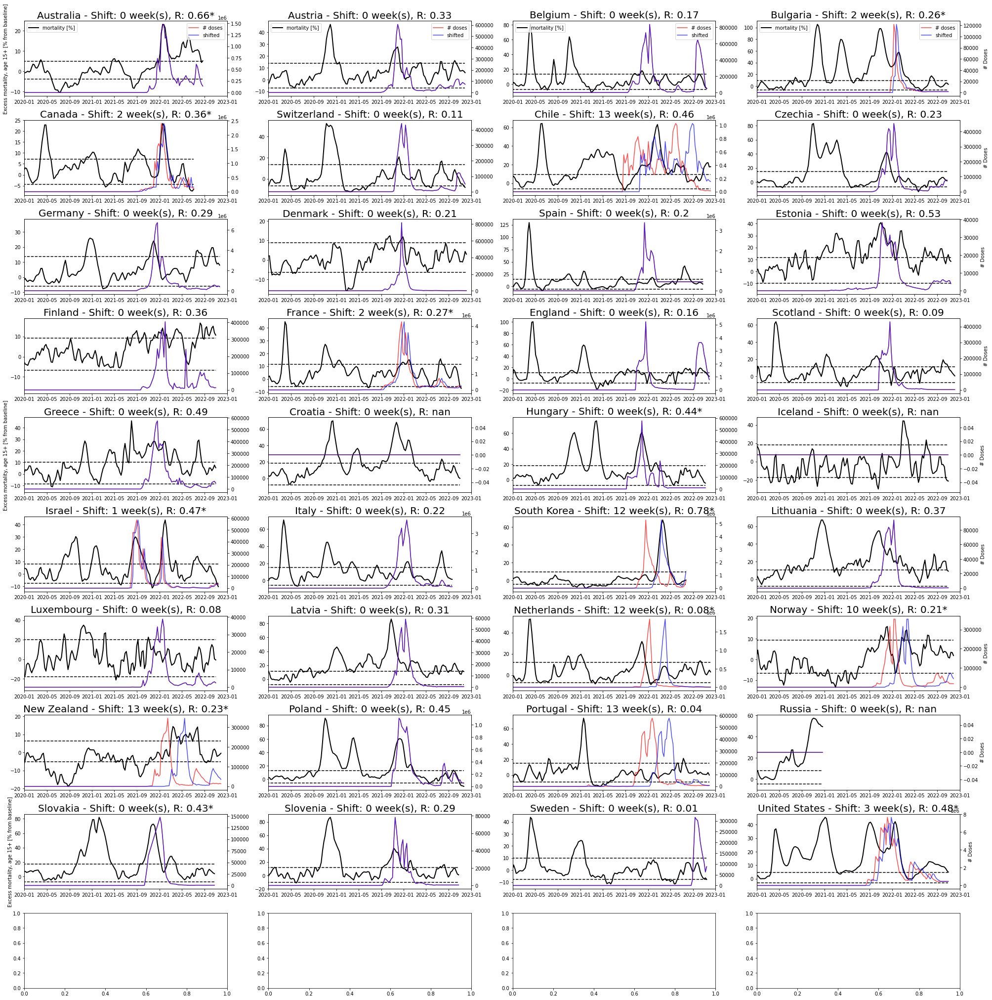

In [530]:
# NOT USED but maybe relevant - Plot shifted data 

n_countries = len(countries)
n_cols = 4
n_rows = int(np.ceil(n_countries / n_cols))
age_string = {"high": "65+", "mid": "15-64", "adult": "15+"}
from statsmodels.tools.sm_exceptions import InfeasibleTestError
for group, age_df in combo.groupby(by=["age_group", "sex"]):
    age_group, sex = group
    if age_group != "adult" or sex != "b":
        continue
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(28,28))
    i = 0
    for country, df in age_df.groupby(by=["country"]):
        j = i % n_cols
        k = i // n_cols
        if df.loc[:, "location"].isnull().iloc[0] or country == "TWN":
            continue
        axs[k, j].plot(df.date, df.centered_per, color="black", linewidth=2, label="mortality [%]")
        axs[k, j].plot(df.date, df.centered_per_low, color="black", linestyle='--')
        axs[k, j].plot(df.date, df.centered_per_high, color="black", linestyle='--')
        
        
        axs[k, j].set_xlim([np.datetime64("2020-01-01"), np.datetime64("2023-01-01")])

        ax2 = axs[k, j].twinx()    
        any_dose = df.weekly_booster_vax
        ax2.plot(df.date, any_dose, label="# doses", color="red", alpha=0.7)
        # Calculate granger causality p-values
        try:
            if lags[country][0] >= 0 and not np.isnan(lags[country][1]):
                h = granger_w_zero_lag(df.loc[:, ["centered_per", "weekly_booster_vax"]], lags[country][0] + 1, verbose=False)
                min_idx = np.argmin(np.array([h_lag[0]["ssr_ftest"][1] for h_lag in h.values()]))
                opt_lag, p_val = (min_idx, h[min_idx + 1][0]["ssr_ftest"][1])
                print(f"{country}: {p_val}")
                signif = p_val < 0.05
            else:
                signif = False
        except InfeasibleTestError as e:
            signif = False
        star = "*" if signif else ""
        title = f"{df.loc[:, 'location'].values[0]} - Shift: {lags[country][0]} week(s), R: {lags[country][1]}{star}"
        axs[k, j].set_title(title, fontsize=20)
        if lags[country][0] == 0:
            ax2.plot(df.date, any_dose, label="shifted", color="blue", alpha=0.7)
        else:
            ax2.plot(df.date[lags[country][0]:], any_dose[:-lags[country][0]], label="shifted", color="blue", alpha=0.7)
        if j == n_cols - 1:
            ax2.set_ylabel("# Doses")
        if j == 0 and k % n_cols == 0:
            axs[k, j].set_ylabel(f"Excess mortality, age {age_string[age_group]} [% from baseline]")
        if k == 0:
            axs[k, j].legend(loc="upper left")
            ax2.legend(loc="upper right")
        i += 1


    fig.tight_layout()
#     plt.savefig(f"../figures/all_countries_mortality_vs_booster_{age_group}_age_{sex}_sex.jpg", dpi=100)
